<a href="https://colab.research.google.com/github/twilinger/img_class_uni/blob/main/Img_uni.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

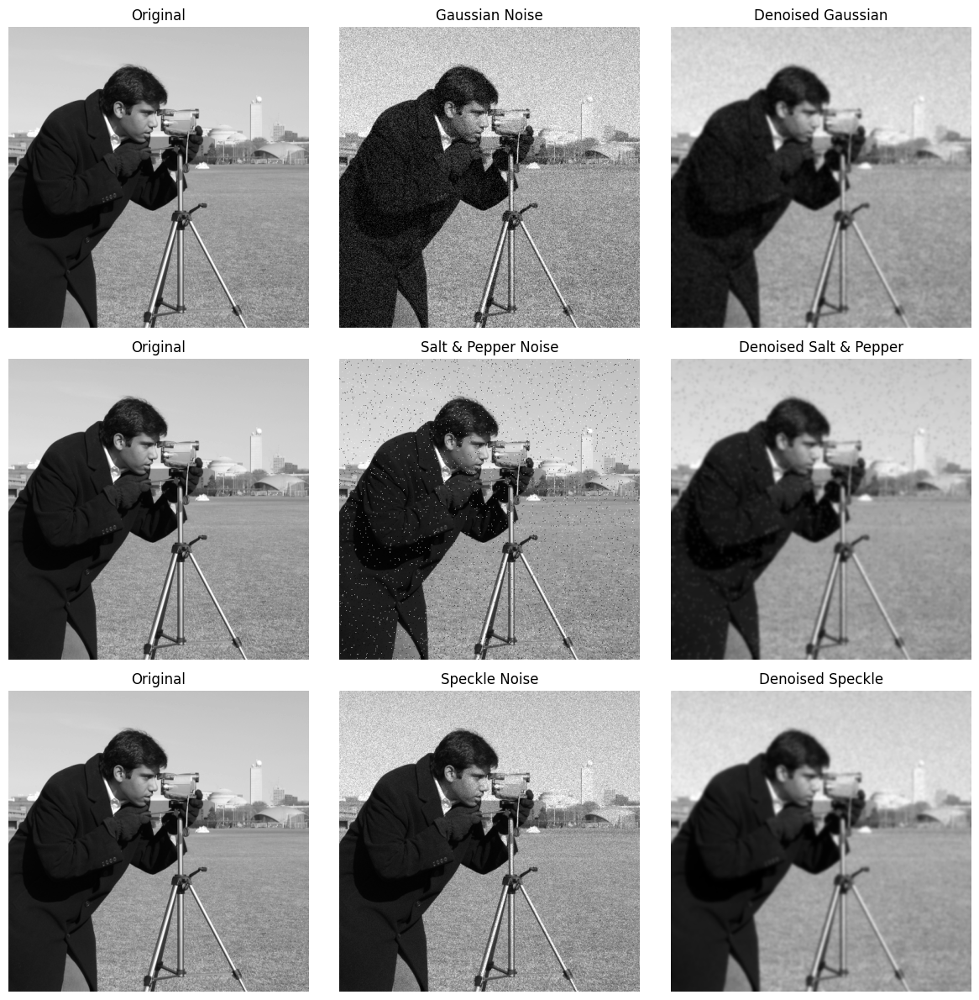

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, img_as_float
from skimage.filters import gaussian
from skimage.util import random_noise

image = img_as_float(data.camera())

def add_noise(image, noise_type="gaussian"):
    if noise_type == "gaussian":
        noisy_image = random_noise(image, mode="gaussian", var=0.01)
    elif noise_type == "salt_pepper":
        noisy_image = random_noise(image, mode="s&p", salt_vs_pepper=0.5, amount=0.02)
    elif noise_type == "speckle":
        noisy_image = random_noise(image, mode="speckle", mean=0, var=0.01)
    else:
        raise ValueError("Unsupported noise type: {}".format(noise_type))
    return noisy_image

def denoise_image(image, sigma=1):
    return gaussian(image, sigma=sigma)


noisy_gaussian = add_noise(image, "gaussian")
noisy_salt_pepper = add_noise(image, "salt_pepper")
noisy_speckle = add_noise(image, "speckle")
denoised_gaussian = denoise_image(noisy_gaussian, sigma=2)
denoised_salt_pepper = denoise_image(noisy_salt_pepper, sigma=2)
denoised_speckle = denoise_image(noisy_speckle, sigma=2)

fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(12, 12))
for ax, img, title in zip(
    axes.flat,
    [image, noisy_gaussian, denoised_gaussian, image, noisy_salt_pepper, denoised_salt_pepper, image, noisy_speckle, denoised_speckle],
    ["Original", "Gaussian Noise", "Denoised Gaussian", "Original", "Salt & Pepper Noise", "Denoised Salt & Pepper", "Original", "Speckle Noise", "Denoised Speckle"],
):
    ax.imshow(img, cmap="gray")
    ax.set_title(title)
    ax.axis("off")

plt.tight_layout()
plt.show()

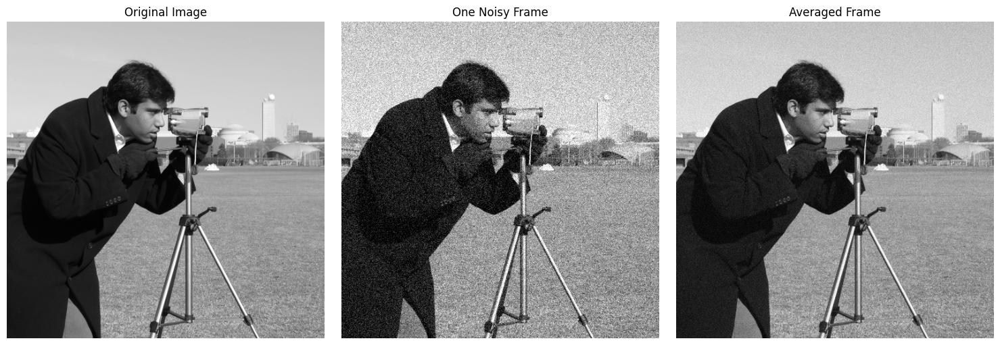

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, img_as_float
from skimage.util import random_noise

original_image = img_as_float(data.camera())

def add_gaussian_noise(image, mean=0, var=0.01):
    return random_noise(image, mode="gaussian", mean=mean, var=var)

n_frames = 10
noisy_frames = [add_gaussian_noise(original_image) for _ in range(n_frames)]
average_frame = np.mean(noisy_frames, axis=0)
fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].imshow(original_image, cmap="gray")
ax[0].set_title("Original Image")
ax[0].axis("off")

ax[1].imshow(noisy_frames[0], cmap="gray")
ax[1].set_title("One Noisy Frame")
ax[1].axis("off")

ax[2].imshow(average_frame, cmap="gray")
ax[2].set_title("Averaged Frame")
ax[2].axis("off")

plt.tight_layout()
plt.show()

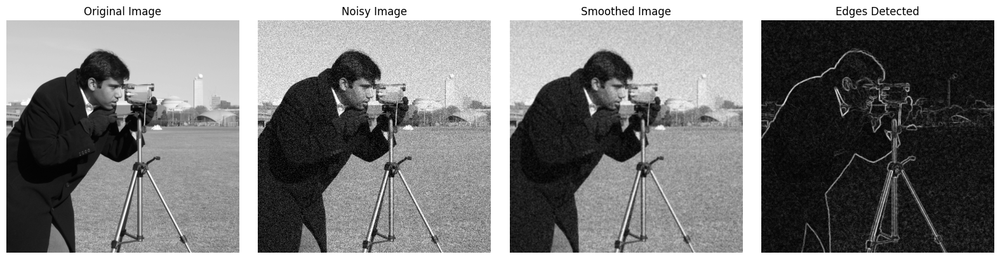

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, filters, img_as_float
from skimage.util import random_noise

image = img_as_float(data.camera())
noisy_image = random_noise(image, mode="gaussian", var=0.01)

smoothed_image = filters.rank.mean(noisy_image, np.ones((3, 3)))

edges = filters.sobel(smoothed_image)
fig, axes = plt.subplots(1, 4, figsize=(16, 4))
axes[0].imshow(image, cmap="gray")
axes[0].set_title("Original Image")
axes[0].axis("off")

axes[1].imshow(noisy_image, cmap="gray")
axes[1].set_title("Noisy Image")
axes[1].axis("off")

axes[2].imshow(smoothed_image, cmap="gray")
axes[2].set_title("Smoothed Image")
axes[2].axis("off")

axes[3].imshow(edges, cmap="gray")
axes[3].set_title("Edges Detected")
axes[3].axis("off")

plt.tight_layout()
plt.show()

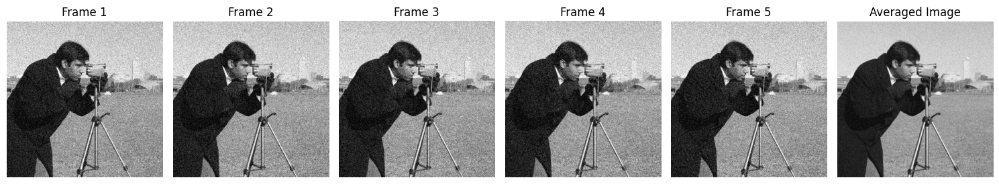

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, img_as_float
from skimage.util import random_noise

original_image = img_as_float(data.camera())
num_frames = 5
noisy_frames = [random_noise(original_image, mode="gaussian", var=0.02) for _ in range(num_frames)]

average_image = np.mean(noisy_frames, axis=0)

fig, axes = plt.subplots(1, num_frames + 1, figsize=(15, 3), sharex=True, sharey=True)
for i, frame in enumerate(noisy_frames):
    axes[i].imshow(frame, cmap="gray")
    axes[i].set_title(f"Frame {i+1}")
    axes[i].axis("off")

axes[-1].imshow(average_image, cmap="gray")
axes[-1].set_title("Averaged Image")
axes[-1].axis("off")

plt.tight_layout()
plt.show()

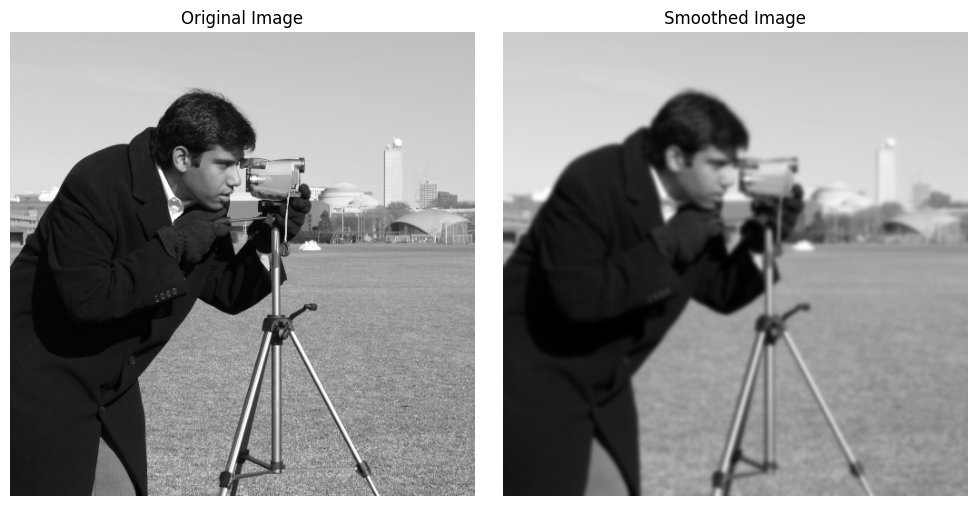

In [ ]:
from skimage import data, img_as_float
from scipy.ndimage import gaussian_filter
import matplotlib.pyplot as plt

image = img_as_float(data.camera())
sigma = 2
smoothed_image = gaussian_filter(image, sigma=sigma)

fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(image, cmap="gray")
ax[0].set_title("Original Image")
ax[0].axis("off")

ax[1].imshow(smoothed_image, cmap="gray")
ax[1].set_title("Smoothed Image")
ax[1].axis("off")

plt.tight_layout()
plt.show()

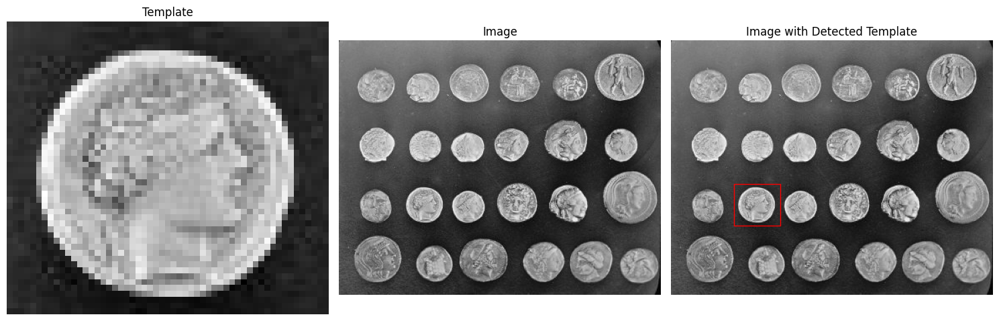

In [ ]:
from skimage import data
from skimage.feature import match_template
import matplotlib.pyplot as plt

image = data.coins()
template = image[170:220, 75:130]

result = match_template(image, template)

ij = np.unravel_index(np.argmax(result), result.shape)
x, y = ij[::-1]

fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].imshow(template, cmap="gray")
ax[0].set_title("Template")
ax[0].axis("off")

ax[1].imshow(image, cmap="gray")
ax[1].set_title("Image")
ax[1].axis("off")
h, w = template.shape
rect = plt.Rectangle((x, y), w, h, edgecolor="r", facecolor="none")
ax[2].add_patch(rect)
ax[2].imshow(image, cmap="gray")
ax[2].set_title("Image with Detected Template")
ax[2].axis("off")

plt.tight_layout()
plt.show()

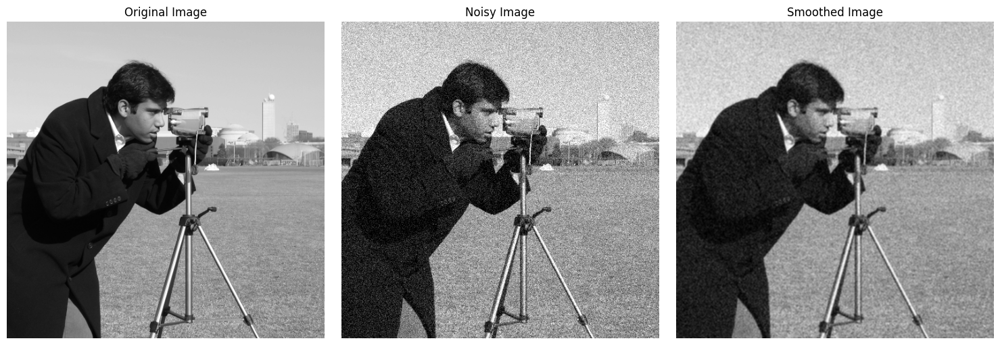

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import convolve
from skimage import data, img_as_float
from skimage.util import random_noise

image = img_as_float(data.camera())
noisy_image = random_noise(image, mode="gaussian", var=0.01)
kernel_size = 3
kernel = np.ones((kernel_size, kernel_size)) / kernel_size**2
smoothed_image = convolve(noisy_image, kernel)
fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].imshow(image, cmap="gray")
ax[0].set_title("Original Image")
ax[0].axis("off")

ax[1].imshow(noisy_image, cmap="gray")
ax[1].set_title("Noisy Image")
ax[1].axis("off")

ax[2].imshow(smoothed_image, cmap="gray")
ax[2].set_title("Smoothed Image")
ax[2].axis("off")

plt.tight_layout()
plt.show()

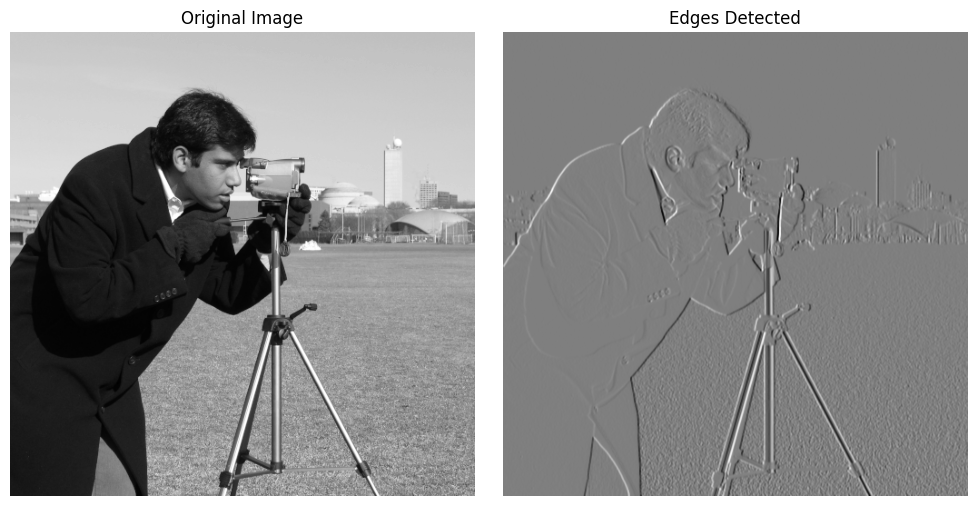

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import convolve
from skimage import data, img_as_float

image = img_as_float(data.camera())
kernel = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
edges = convolve(image, kernel)
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(image, cmap="gray")
ax[0].set_title("Original Image")
ax[0].axis("off")

ax[1].imshow(edges, cmap="gray")
ax[1].set_title("Edges Detected")
ax[1].axis("off")

plt.tight_layout()
plt.show()

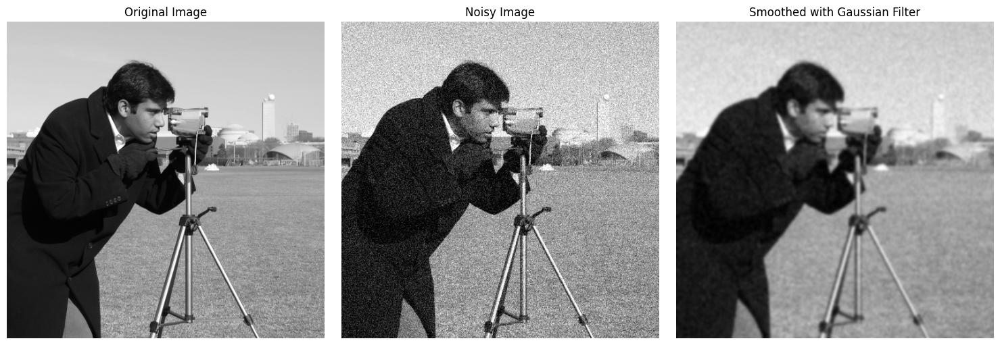

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
from skimage import data, img_as_float
from skimage.util import random_noise

image = img_as_float(data.camera())
noisy_image = random_noise(image, mode="gaussian", var=0.01)

sigma = 2
smoothed_image = gaussian_filter(noisy_image, sigma=sigma)

fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].imshow(image, cmap="gray")
ax[0].set_title("Original Image")
ax[0].axis("off")

ax[1].imshow(noisy_image, cmap="gray")
ax[1].set_title("Noisy Image")
ax[1].axis("off")

ax[2].imshow(smoothed_image, cmap="gray")
ax[2].set_title("Smoothed with Gaussian Filter")
ax[2].axis("off")

plt.tight_layout()
plt.show()

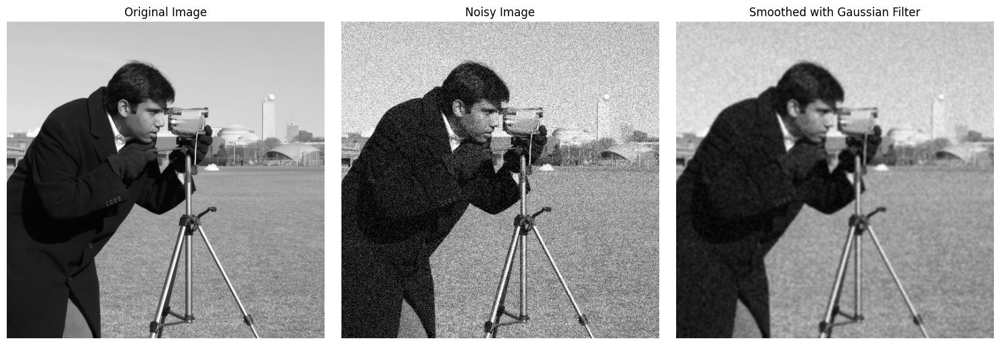

In [ ]:
from scipy.ndimage import convolve
import numpy as np

def gaussian_kernel(size, sigma=1.0):
    size = int(size) // 2
    x, y = np.mgrid[-size : size + 1, -size : size + 1]
    g = np.exp(-(x**2 + y**2) / (2 * sigma**2))
    return g / g.sum()

kernel = gaussian_kernel(5, sigma=2)

smoothed_image_explicit = convolve(noisy_image, kernel)

fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].imshow(image, cmap="gray")
ax[0].set_title("Original Image")
ax[0].axis("off")

ax[1].imshow(noisy_image, cmap="gray")
ax[1].set_title("Noisy Image")
ax[1].axis("off")

ax[2].imshow(smoothed_image_explicit, cmap="gray")
ax[2].set_title("Smoothed with Gaussian Filter")
ax[2].axis("off")

plt.tight_layout()
plt.show()

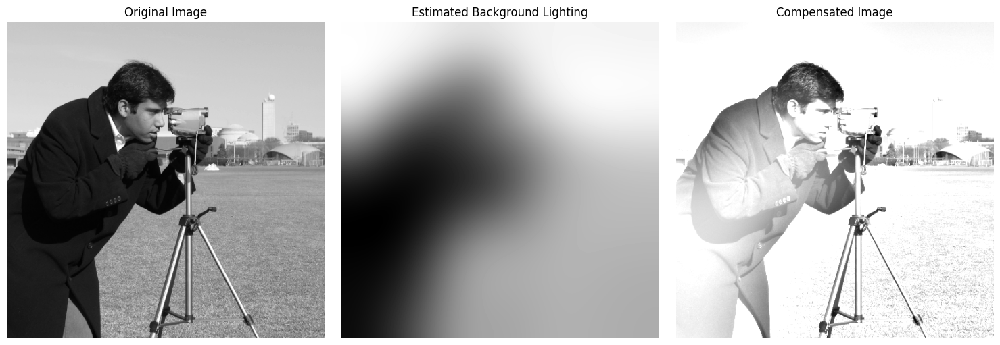

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, img_as_float
from scipy.ndimage import gaussian_filter

image = img_as_float(data.camera())
sigma = 50
background = gaussian_filter(image, sigma=sigma)

compensated_image = image - background + 1
compensated_image = np.clip(compensated_image, 0, 1)

fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].imshow(image, cmap="gray")
ax[0].set_title("Original Image")
ax[0].axis("off")

ax[1].imshow(background, cmap="gray")
ax[1].set_title("Estimated Background Lighting")
ax[1].axis("off")

ax[2].imshow(compensated_image, cmap="gray")
ax[2].set_title("Compensated Image")
ax[2].axis("off")

plt.tight_layout()
plt.show()

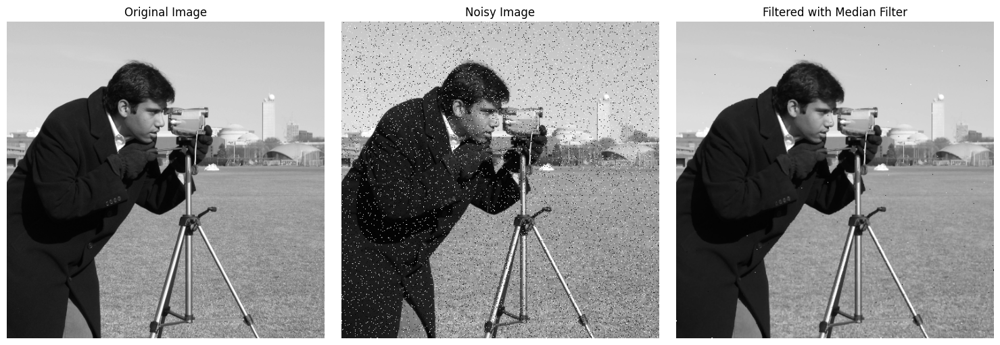

In [ ]:
import matplotlib.pyplot as plt
from skimage import data, util
from skimage.filters import median
from skimage.morphology import disk

image = data.camera()

noisy_image = util.random_noise(image, mode="s&p", amount=0.05)
filtered_image = median(noisy_image, disk(1))

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(image, cmap="gray")
axes[0].set_title("Original Image")
axes[0].axis("off")

axes[1].imshow(noisy_image, cmap="gray")
axes[1].set_title("Noisy Image")
axes[1].axis("off")

axes[2].imshow(filtered_image, cmap="gray")
axes[2].set_title("Filtered with Median Filter")
axes[2].axis("off")

plt.tight_layout()
plt.show()

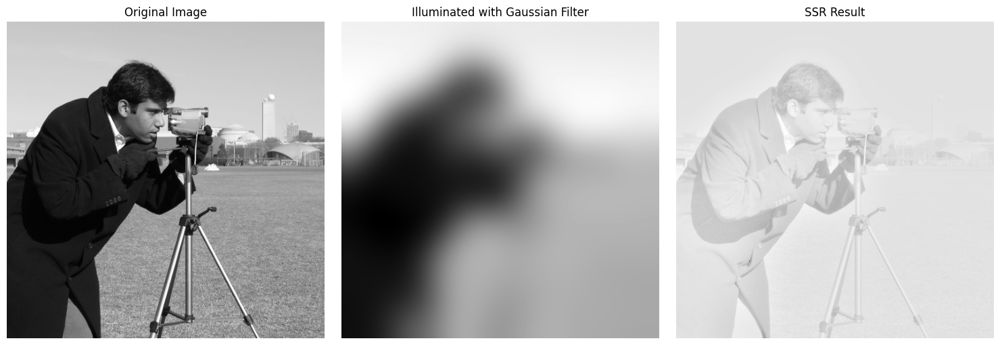

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, img_as_float
from scipy.ndimage import gaussian_filter

image = img_as_float(data.camera())

sigma = 30
illuminated = gaussian_filter(image, sigma=sigma)

ssr_image = np.log10(image + 1e-6) - np.log10(illuminated + 1e-6)

ssr_image = (ssr_image - ssr_image.min()) / (ssr_image.max() - ssr_image.min())

fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].imshow(image, cmap="gray")
ax[0].set_title("Original Image")
ax[0].axis("off")

ax[1].imshow(illuminated, cmap="gray")
ax[1].set_title("Illuminated with Gaussian Filter")
ax[1].axis("off")

ax[2].imshow(ssr_image, cmap="gray")
ax[2].set_title("SSR Result")
ax[2].axis("off")

plt.tight_layout()
plt.show()

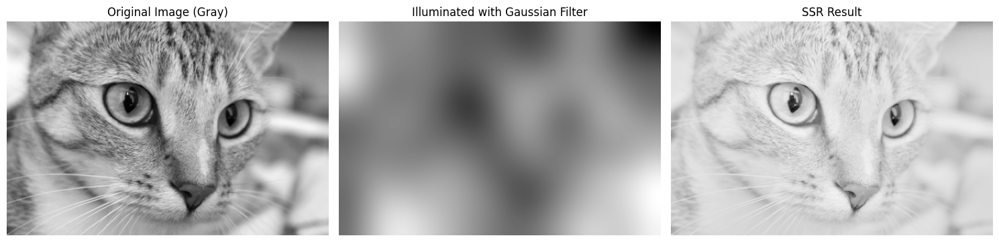

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, img_as_float, color
from scipy.ndimage import gaussian_filter

image = img_as_float(data.chelsea())
image_gray = color.rgb2gray(image)

sigma = 30
illuminated = gaussian_filter(image_gray, sigma=sigma)

ssr_image = np.log10(image_gray + 1e-6) - np.log10(illuminated + 1e-6)

ssr_image = (ssr_image - ssr_image.min()) / (ssr_image.max() - ssr_image.min())

fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].imshow(image_gray, cmap="gray")
ax[0].set_title("Original Image (Gray)")
ax[0].axis("off")

ax[1].imshow(illuminated, cmap="gray")
ax[1].set_title("Illuminated with Gaussian Filter")
ax[1].axis("off")

ax[2].imshow(ssr_image, cmap="gray")
ax[2].set_title("SSR Result")
ax[2].axis("off")

plt.tight_layout()
plt.show()

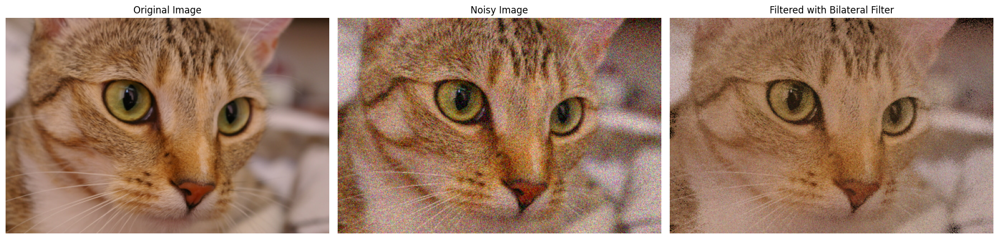

In [ ]:
import matplotlib.pyplot as plt
from skimage import data, img_as_float
from skimage.restoration import denoise_bilateral

image = img_as_float(data.chelsea())
noisy_image = util.random_noise(image, mode="gaussian", var=0.01)

filtered_image = denoise_bilateral(noisy_image, sigma_color=0.05, sigma_spatial=15, channel_axis=-1)

fig, ax = plt.subplots(1, 3, figsize=(18, 6))
ax[0].imshow(image)
ax[0].set_title("Original Image")
ax[0].axis("off")

ax[1].imshow(noisy_image)
ax[1].set_title("Noisy Image")
ax[1].axis("off")

ax[2].imshow(filtered_image)
ax[2].set_title("Filtered with Bilateral Filter")
ax[2].axis("off")

plt.tight_layout()
plt.show()

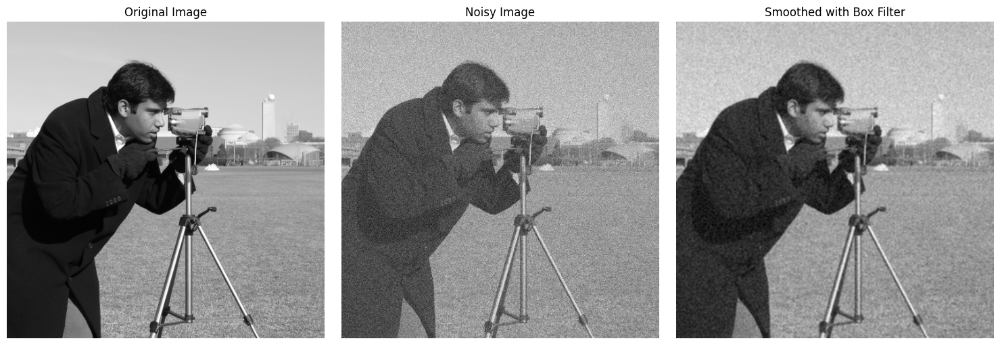

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, img_as_float
from scipy.ndimage import uniform_filter

image = img_as_float(data.camera())

noisy_image = image + 0.1 * np.random.standard_normal(image.shape)

smoothed_image = uniform_filter(noisy_image, size=3)

fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].imshow(image, cmap="gray")
ax[0].set_title("Original Image")
ax[0].axis("off")

ax[1].imshow(noisy_image, cmap="gray")
ax[1].set_title("Noisy Image")
ax[1].axis("off")

ax[2].imshow(smoothed_image, cmap="gray")
ax[2].set_title("Smoothed with Box Filter")
ax[2].axis("off")

plt.tight_layout()
plt.show()

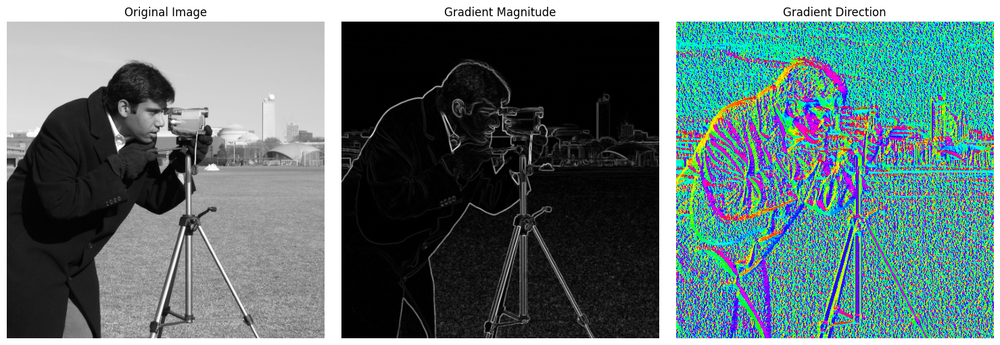

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, img_as_float
from scipy.ndimage import sobel

image = img_as_float(data.camera())

sobel_x = sobel(image, axis=0)
sobel_y = sobel(image, axis=1)

gradient_magnitude = np.sqrt(sobel_x**2 + sobel_y**2)

gradient_magnitude = (gradient_magnitude - gradient_magnitude.min()) / (gradient_magnitude.max() - gradient_magnitude.min())

fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].imshow(image, cmap="gray")
ax[0].set_title("Original Image")
ax[0].axis("off")

ax[1].imshow(gradient_magnitude, cmap="gray")
ax[1].set_title("Gradient Magnitude")
ax[1].axis("off")

gradient_direction = np.arctan2(sobel_y, sobel_x)
ax[2].imshow(gradient_direction, cmap="hsv")
ax[2].set_title("Gradient Direction")
ax[2].axis("off")

plt.tight_layout()
plt.show()

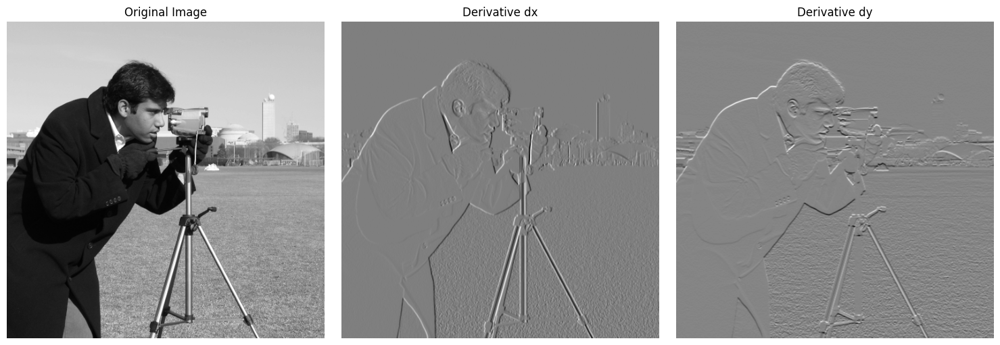

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import convolve
from skimage import data, img_as_float

image = img_as_float(data.camera())

kernel_dx = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])

kernel_dy = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])

dx = convolve(image, kernel_dx)
dy = convolve(image, kernel_dy)

fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].imshow(image, cmap="gray")
ax[0].set_title("Original Image")
ax[0].axis("off")

ax[1].imshow(dx, cmap="gray")
ax[1].set_title("Derivative dx")
ax[1].axis("off")

ax[2].imshow(dy, cmap="gray")
ax[2].set_title("Derivative dy")
ax[2].axis("off")

plt.tight_layout()
plt.show()

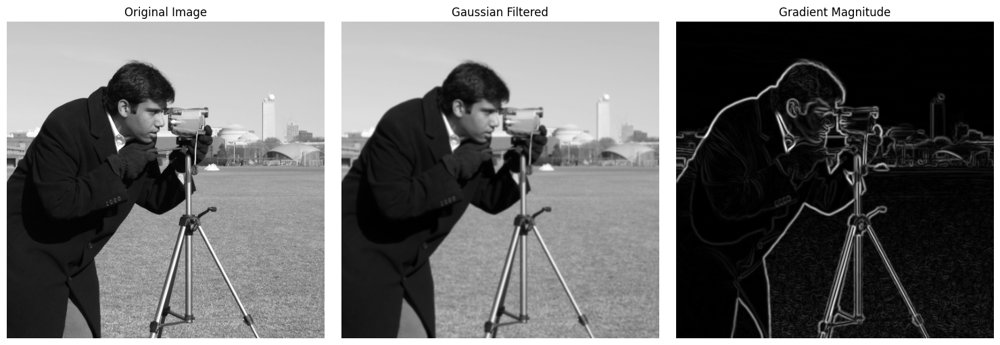

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter, gaussian_gradient_magnitude
from skimage import data, img_as_float

image = img_as_float(data.camera())

sigma = 1
smoothed_image = gaussian_filter(image, sigma=sigma)

gradient_magnitude = gaussian_gradient_magnitude(smoothed_image, sigma=sigma)

fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].imshow(image, cmap="gray")
ax[0].set_title("Original Image")
ax[0].axis("off")

ax[1].imshow(smoothed_image, cmap="gray")
ax[1].set_title("Gaussian Filtered")
ax[1].axis("off")

ax[2].imshow(gradient_magnitude, cmap="gray")
ax[2].set_title("Gradient Magnitude")
ax[2].axis("off")

plt.tight_layout()
plt.show()

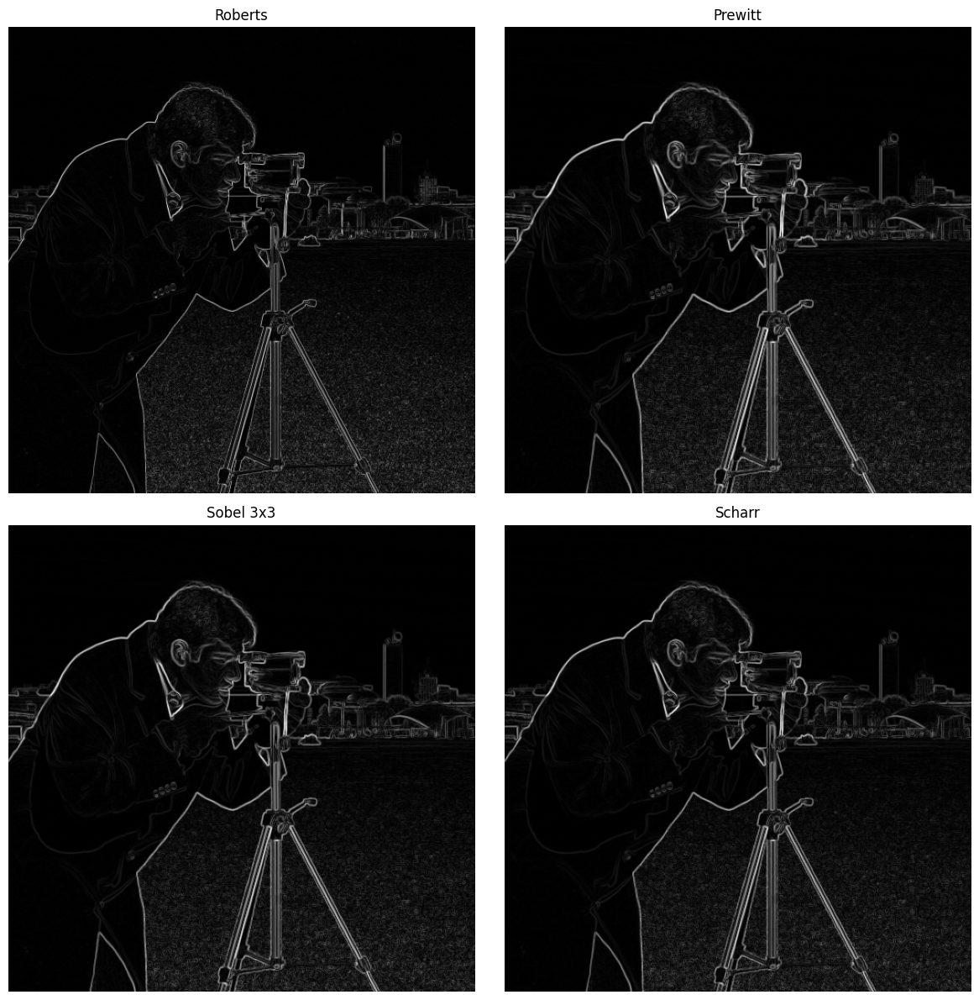

In [ ]:
import matplotlib.pyplot as plt
from skimage import data, filters, img_as_float

image = img_as_float(data.camera())

edges_roberts = filters.roberts(image)
edges_prewitt = filters.prewitt(image)
edges_sobel = filters.sobel(image)
edges_scharr = filters.scharr(image)

fig, axes = plt.subplots(2, 2, figsize=(12, 12))
ax = axes.ravel()

ax[0].imshow(edges_roberts, cmap="gray")
ax[0].set_title("Roberts")

ax[1].imshow(edges_prewitt, cmap="gray")
ax[1].set_title("Prewitt")

ax[2].imshow(edges_sobel, cmap="gray")
ax[2].set_title("Sobel 3x3")

ax[3].imshow(edges_scharr, cmap="gray")
ax[3].set_title("Scharr")

for a in ax:
    a.axis("off")

plt.tight_layout()
plt.show()

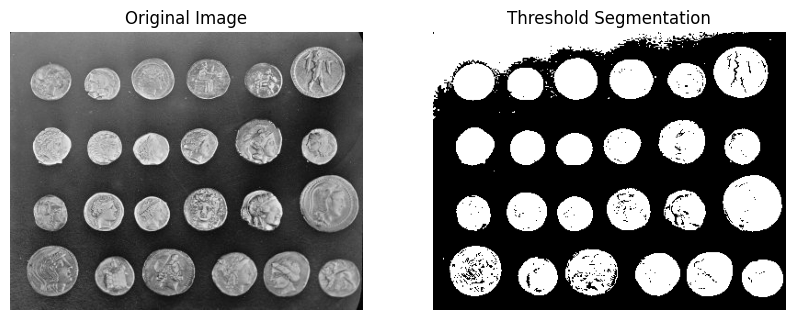

In [ ]:
from skimage import data, filters
import matplotlib.pyplot as plt

image = data.coins()

thresh = filters.threshold_otsu(image)
binary = image > thresh

fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(image, cmap="gray")
ax[0].set_title("Original Image")
ax[0].axis("off")

ax[1].imshow(binary, cmap="gray")
ax[1].set_title("Threshold Segmentation")
ax[1].axis("off")

plt.show()

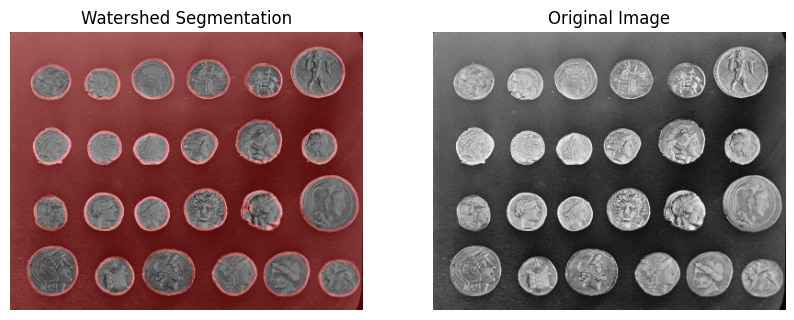

In [ ]:
from skimage import data, color, measure, morphology
from skimage.filters import sobel
from skimage.segmentation import watershed
import matplotlib.pyplot as plt

image = data.coins()
edges = sobel(image)

markers = np.zeros_like(image)
foreground, background = 1, 2
markers[image < 30] = background
markers[image > 150] = foreground

segmentation = watershed(edges, markers)
segmentation = morphology.dilation(segmentation - 1, morphology.disk(3))

fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(color.label2rgb(segmentation, image=image))
ax[0].set_title("Watershed Segmentation")
ax[0].axis("off")

ax[1].imshow(image, cmap="gray")
ax[1].set_title("Original Image")
ax[1].axis("off")

plt.show()

Contrast: 76.50131851851853
Dissimilarity: 5.308992592592593
Homogeneity: 0.2828784249938924
Energy: 0.023644684046869157
Correlation: 0.96288626172681


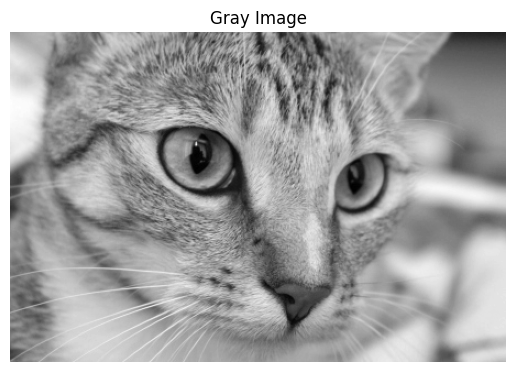

In [ ]:
from skimage import data, img_as_ubyte
from skimage.color import rgb2gray
from skimage.feature import graycomatrix, graycoprops
import matplotlib.pyplot as plt

image = img_as_float(data.chelsea())
image_gray = color.rgb2gray(image)
image_gray = img_as_ubyte(image_gray)


glcm = graycomatrix(image_gray, distances=[1], angles=[0], levels=256, symmetric=True, normed=True)


contrast = graycoprops(glcm, "contrast")
dissimilarity = graycoprops(glcm, "dissimilarity")
homogeneity = graycoprops(glcm, "homogeneity")
energy = graycoprops(glcm, "energy")
correlation = graycoprops(glcm, "correlation")


print(f"Contrast: {contrast[0, 0]}")
print(f"Dissimilarity: {dissimilarity[0, 0]}")
print(f"Homogeneity: {homogeneity[0, 0]}")
print(f"Energy: {energy[0, 0]}")
print(f"Correlation: {correlation[0, 0]}")


plt.imshow(image_gray, cmap="gray")
plt.title("Gray Image")
plt.axis("off")
plt.show()

## Источники текстур

### Outex

**Сайт**: http://www.outex.oulu.fi/


### DTD (Describable Textures Dataset)

**Сайт**: https://www.robots.ox.ac.uk/~vgg/data/dtd/index.html



In [ ]:
import os
import numpy as np
from skimage import io, color, img_as_ubyte
from skimage.feature import graycomatrix, graycoprops
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report

data_dir = "C:\\git\\image_processing\\data\\dtd\\images"
categories = ["banded", "blotchy", "braided", "bubbly", "chequered", "cobwebbed"]  # и т.д.


def extract_features(image_path):
    image = io.imread(image_path)
    image_gray = color.rgb2gray(image)
    image_gray = img_as_ubyte(image_gray)
    glcm = graycomatrix(image_gray, distances=[1], angles=[0], levels=256, symmetric=True, normed=True)
    features = [graycoprops(glcm, prop).ravel()[0] for prop in ["contrast", "dissimilarity", "homogeneity", "energy", "correlation"]]
    return features


X = []
y = []
for category in categories:
    category_dir = os.path.join(data_dir, category)
    for file_name in os.listdir(category_dir):
        file_path = os.path.join(category_dir, file_name)
        features = extract_features(file_path)
        X.append(features)
        y.append(category)

X = np.array(X)
y = np.array(y)


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)


knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(X_train, y_train)

y_pred = knn.predict(X_test)
print(classification_report(y_test, y_pred))

FileNotFoundError: [Errno 2] No such file or directory: 'C:\\git\\image_processing\\data\\dtd\\images/banded'

In [ ]:
from skimage import io, color, img_as_ubyte
from skimage.feature import graycomatrix, graycoprops


def show_image(image):
    plt.imshow(image, cmap="gray")
    plt.title("Gray Image")
    plt.axis("off")
    plt.show()



def extract_features(image_path):
    image = io.imread(image_path)
    image_gray = color.rgb2gray(image)
    image_gray = img_as_ubyte(image_gray)
    show_image(image_gray)
    glcm = graycomatrix(image_gray, distances=[1], angles=[0], levels=256, symmetric=True, normed=True)
    features = [graycoprops(glcm, prop).ravel()[0] for prop in ["contrast", "dissimilarity", "homogeneity", "energy", "correlation"]]
    return features



image_path = "data/image1.jpg"


new_image_features = extract_features(image_path)


new_image_features = np.array(new_image_features).reshape(1, -1)
predicted_class = knn.predict(new_image_features)
print(f"Предсказанный класс для 'image1.jpg': {predicted_class[0]}")